In [69]:
images=[]
labels=[]

In [70]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [71]:
import os

In [72]:
os.listdir("/content/drive/MyDrive/dataset")

['with_mask', 'without_mask']

In [73]:
import cv2

In [74]:
for i in ['without_mask', 'with_mask']:
    imageNameList=os.listdir("/content/drive/MyDrive/dataset/" + str(i))
    for fileName in imageNameList:
        Image=cv2.imread("/content/drive/MyDrive/dataset/" + str(i) + "/" + str(fileName))
        try:
            gray=cv2.cvtColor(Image,cv2.COLOR_BGR2GRAY)
            Image=cv2.resize(gray,(100,100))
            images.append(Image)
            if i=="without_mask":
                labels.append(0)
            else:
                labels.append(1)
        except:
            pass
    print("Inside folder ", i)
        
        

Inside folder  without_mask
Inside folder  with_mask


In [75]:
import numpy as np

In [76]:
images=np.array(images)
labels=np.array(labels)

In [77]:
type(images)

numpy.ndarray

In [78]:
type(labels)

numpy.ndarray

In [79]:
from sklearn.model_selection import train_test_split

In [80]:
train_features,test_features,train_target,test_target=train_test_split(images,labels,test_size=0.2)

In [81]:
train_features.shape

(1100, 100, 100)

In [82]:
train_target.shape

(1100,)

In [83]:
test_features.shape

(276, 100, 100)

In [84]:
test_target.shape

(276,)

In [85]:
def preprocessing(img):

    img=img/255
    return img

In [86]:
train_features=np.array(list(map(preprocessing,train_features)))

In [87]:
train_features.shape

(1100, 100, 100)

In [88]:
train_features=train_features.reshape(train_features.shape[0], train_features.shape[1],train_features.shape[2],1)

In [89]:
train_features.shape

(1100, 100, 100, 1)

In [90]:
test_features=np.array(list(map(preprocessing,test_features)))

In [91]:
test_features.shape

(276, 100, 100)

In [92]:
test_features=test_features.reshape(test_features.shape[0],test_features.shape[1],test_features.shape[2],1)

In [93]:
test_features.shape

(276, 100, 100, 1)

In [94]:
from keras.preprocessing.image import ImageDataGenerator

In [95]:
dataGenerator=ImageDataGenerator(width_shift_range=0.1,height_shift_range=0.1,zoom_range=0.2,shear_range=0.1,rotation_range=10)

In [96]:
dataGenerator.fit(train_features)

In [97]:
batches=dataGenerator.flow(train_features,train_target,batch_size=20)

In [98]:
batches

In [99]:
X_batch,y_batch=next(batches)

In [100]:
import matplotlib.pyplot as plt

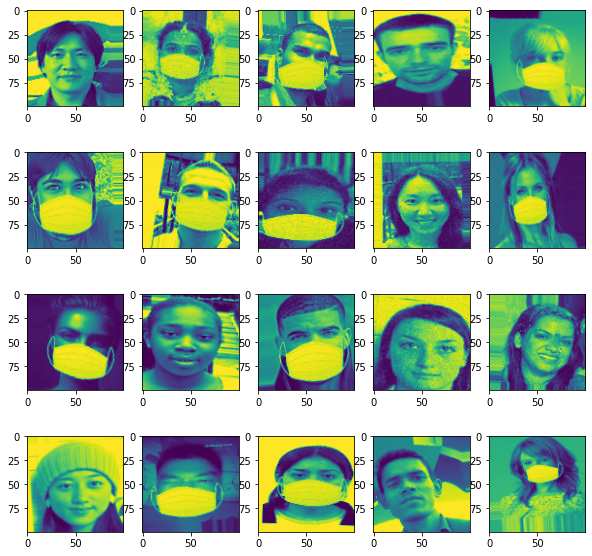

In [101]:
plt.figure(figsize=(10,10))
for i in range(20):
    plt.subplot(4,5,i+1)
    plt.imshow(X_batch[i].reshape(100,100))
plt.show()

In [102]:
train_target.shape

(1100,)

In [103]:
from tensorflow.keras.utils import to_categorical

In [104]:
train_target=to_categorical(train_target)

In [105]:
test_target=to_categorical(test_target)

In [106]:
train_target.shape

(1100, 2)

In [107]:
test_features.shape

(276, 100, 100, 1)

In [108]:
test_target.shape

(276, 2)

In [109]:
from keras.models import Sequential
from keras.layers import Flatten,Conv2D,MaxPooling2D,Dense,Dropout


# Step 1: Specify the architecture

In [110]:
model=Sequential()
model.add(Conv2D(60,(5,5),activation="relu",input_shape=(100, 100, 1)))
model.add(Conv2D(60,(5,5),activation="relu"))
model.add(MaxPooling2D((2,2)))
model.add(Conv2D(60,(5,5),activation="relu"))
model.add(Conv2D(30,(5,5),activation="relu"))
model.add(MaxPooling2D((2,2)))
model.add(Dropout(0.5))
model.add(Flatten())
model.add(Dense(500,activation="relu"))
model.add(Dense(2,activation="softmax"))

# Step 2: Compile the model

In [111]:
from tensorflow.keras.optimizers import Adam

In [112]:
model.compile(Adam(lr=0.001),loss="categorical_crossentropy",metrics=["accuracy"])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


# Step 3: fit the model

In [113]:
train_features.shape

(1100, 100, 100, 1)

In [114]:
train_target.shape

(1100, 2)

In [115]:
model.fit_generator(dataGenerator.flow(train_features,train_target,batch_size=20),epochs=10)

Epoch 1/10


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  """Entry point for launching an IPython kernel.


55/55 [==============================] - 2s 34ms/step - loss: 0.7033 - accuracy: 0.5927
Epoch 2/10
55/55 [==============================] - 2s 34ms/step - loss: 0.5181 - accuracy: 0.7536
Epoch 3/10
55/55 [==============================] - 2s 33ms/step - loss: 0.3709 - accuracy: 0.8482
Epoch 4/10
55/55 [==============================] - 2s 33ms/step - loss: 0.3684 - accuracy: 0.8591
Epoch 5/10
55/55 [==============================] - 2s 33ms/step - loss: 0.3004 - accuracy: 0.8855
Epoch 6/10
55/55 [==============================] - 2s 32ms/step - loss: 0.2222 - accuracy: 0.9182
Epoch 7/10
55/55 [==============================] - 2s 33ms/step - loss: 0.2036 - accuracy: 0.9164
Epoch 8/10
55/55 [==============================] - 2s 33ms/step - loss: 0.1648 - accuracy: 0.9455
Epoch 9/10
55/55 [==============================] - 2s 33ms/step - loss: 0.1828 - accuracy: 0.9355
Epoch 10/10
55/55 [==============================] - 2s 33ms/step - loss: 0.1537 - accuracy: 0.9427


In [126]:
import numpy as np
import cv2

 

def getClassName(classNo):
    if (classNo == 0):
      return 'without_mask';
    elif (classNo == 1):
      return 'with_mask';

In [117]:
from google.colab.patches import cv2_imshow

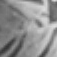

In [118]:
import cv2

# Load the cascade
face_cascade = cv2.CascadeClassifier('/content/drive/MyDrive/haarcascade_frontalface_default.xml')
# Read the input image
img = cv2.imread('/content/drive/MyDrive/dataset/with_mask/prajna.jpg')
imgOriginal = img
# Convert into grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# Detect faces
faces = face_cascade.detectMultiScale(gray, 1.1, 10)
# Draw rectangle around the faces
for (x, y, w, h) in faces:
    cv2.rectangle(img, (x, y), (x+w, y+h), (255, 0, 0), 2)
    face_img=gray[y:y+h,x:x+w]
# Display the output
cv2_imshow(face_img)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [119]:
face_img

array([[ 95,  96, 100, ..., 215, 205, 193],
       [103, 103, 103, ..., 174, 164, 151],
       [107, 107, 106, ..., 129, 119, 107],
       ...,
       [ 74,  86,  97, ..., 178, 184, 192],
       [ 90, 102, 112, ..., 180, 183, 190],
       [104, 116, 125, ..., 182, 184, 189]], dtype=uint8)

In [120]:
face_img.shape

(57, 57)

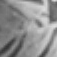

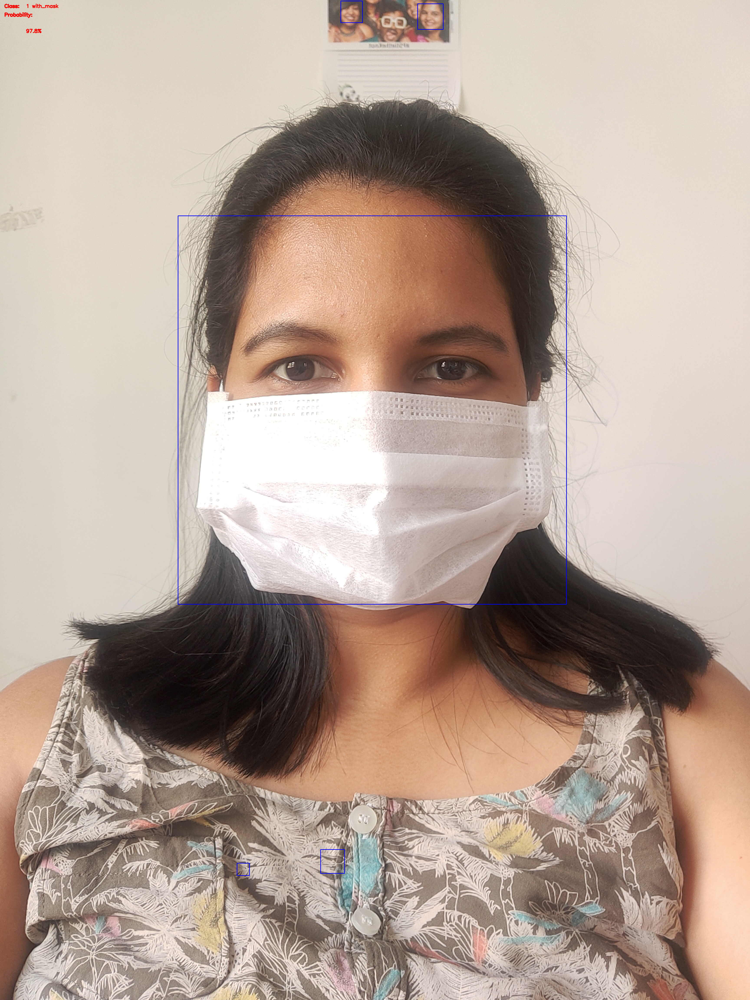

In [136]:
font = cv2.FONT_HERSHEY_SIMPLEX
img=preprocessing(face_img)
cv2_imshow(face_img)
img=cv2.resize(img,(100,100))
img=img.reshape(1,100,100,1)
cv2.putText(imgOriginal,"Class: ",(20,35),font,0.75,(0,0,255),2,cv2.LINE_AA)
cv2.putText(imgOriginal,"Probability: ",(20,75),font,0.75,(0,0,255),2,cv2.LINE_AA)
predictions=model.predict(img)
classIndex=model.predict(img)

if classIndex.item(0)>classIndex.item(1):
  classIndex = 1;
else:
  classIndex = 0;

probabilityValue=np.amax(predictions)
if probabilityValue>0.75:
    cv2.putText(imgOriginal,str(classIndex) + " "+ str(getClassName(classIndex)),(120,35),font,0.75,(0,0,255),2,cv2.LINE_AA)
    cv2.putText(imgOriginal,str(round(probabilityValue*100,2)) + "%",(120,150),font,0.75,(0,0,255),2,cv2.LINE_AA)
cv2_imshow(imgOriginal)
cv2.waitKey(0)
cv2.destroyAllWindows()